# GVHD project integrated analysis

In [1]:
#!pip install torchmetrics==0.9.3


In [2]:
#!pip install openpyxl
#anndata needs to be 0.8.0
from glob import glob
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import anndata
import pickle
import matplotlib.pyplot as plt
from tqdm import tqdm
import gc
import tarfile
import seaborn as sns
import scvi
import torch

from collections import OrderedDict
import pickle
#import scrublet as scr
import scipy.io
import matplotlib.pyplot as plt
import os
from pathlib import Path

/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing CSCDataset from `anndata.experimental` is deprecated. Import anndata.abc.CSCDataset instead.
  warnings.warn(msg, FutureWarning)
/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Impo

In [3]:
# Paths — relative to this notebook's location (GVHD_Reproducibility-main/Sc&TCR_Pipelines/)
PROJECT_ROOT     = Path('../..')
META_PATH        = PROJECT_ROOT / 'GVHD_Reproducibility-main' / 'scRNAseq_TCR_samples_meta_LS-15_f.xlsx'
MARKERS_PATH     = PROJECT_ROOT / 'GVHD_Reproducibility-main' / 'Major_cell_type_markers.xlsx'
MARKERS_SPATIAL_PATH = PROJECT_ROOT / 'GVHD_Reproducibility-main' / 'GVHD_spatial_signature_v8_major_curated_unique_epi.csv'

# Input paths
BATCH_CORRECTED_PATH = PROJECT_ROOT / 'adata_file' / 'combined_batch_corrected_all.h5ad'

# Output paths
DEDF_OUTPUT_PATH           = PROJECT_ROOT / 'adata_file' / 'dedf_major_cell_types.csv'
FILTERED_PATH        = PROJECT_ROOT / 'adata_file' / 'filtered_combined.h5ad'
FILTERED_ANNOTATED_PATH    = PROJECT_ROOT / 'adata_file' / 'filtered_combined_annotated.h5ad'

In [4]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.set_figure_params(dpi=80)

-----
anndata     0.11.1
scanpy      1.10.4
-----
Cython                      3.0.12
PIL                         11.0.0
absl                        NA
anyio                       NA
appnope                     0.1.4
arrow                       1.3.0
asttokens                   NA
attr                        24.2.0
attrs                       24.2.0
babel                       2.16.0
certifi                     2024.08.30
charset_normalizer          3.4.0
chex                        0.1.87
comm                        0.2.2
cycler                      0.12.1
cython                      3.0.12
cython_runtime              NA
dateutil                    2.9.0.post0
debugpy                     1.8.9
decorator                   5.1.1
defusedxml                  0.7.1
docrep                      0.3.2
etils                       1.11.0
executing                   2.1.0
fastjsonschema              NA
filelock                    3.16.1
flax                        0.10.2
fqdn                     

/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/session_info/main.py:213: UserWarning: The '__version__' attribute is deprecated and will be removed in MarkupSafe 3.1. Use feature detection, or `importlib.metadata.version("markupsafe")`, instead.
  mod_version = _find_version(mod.__version__)


# Loading data

In [5]:
#!pip install openpyxl

In [6]:
# Update the sample list here need to be the same as sample ID
Sample_list = ["R096_Tc17_up","R096_Tc17_low","RH01","RH02","RH03","RH04","RH05","RH06","RH07","RH08","RH09","RH10","RH11","RH12","RH13","RH14","UA01","UA02","UA03","UA04","UA05","UA06","UA07","UA08","UA09","UA10","UA11","UA12",'UA13','UA14','UA15','UA19','UA20','UA21','UA22','UA23','UA24','UA26','UA30','UA31','UA32','UA33','UA34','UA35','UA36','UA37','UA38','UA39','UA40','UA41']


In [7]:
combined = anndata.read_h5ad(BATCH_CORRECTED_PATH)

In [8]:
combined

AnnData object with n_obs × n_vars = 168267 × 38224
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'umap'
    obsm: 'X_scVI', 'X_umap', 'scvi'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

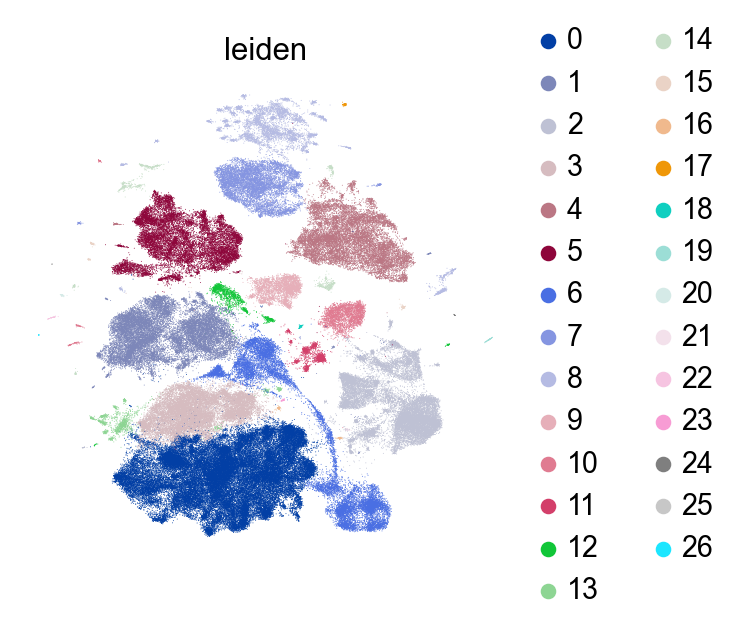

In [9]:

sc.pl.umap(combined, color=['leiden'], frameon=False)



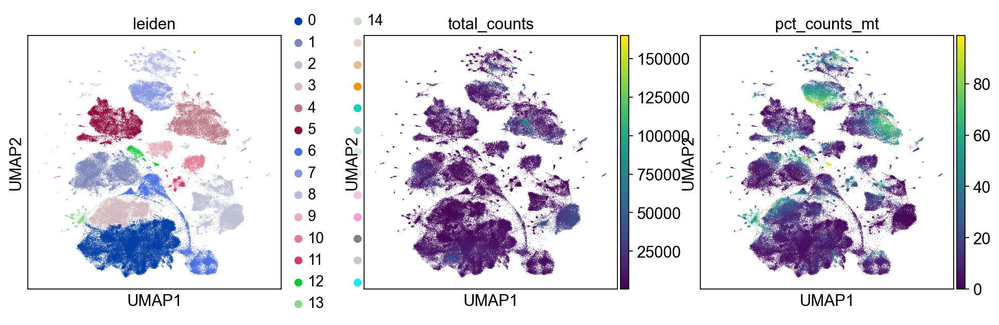

In [10]:
sc.pl.umap(combined, color=['leiden','total_counts', 'pct_counts_mt'])

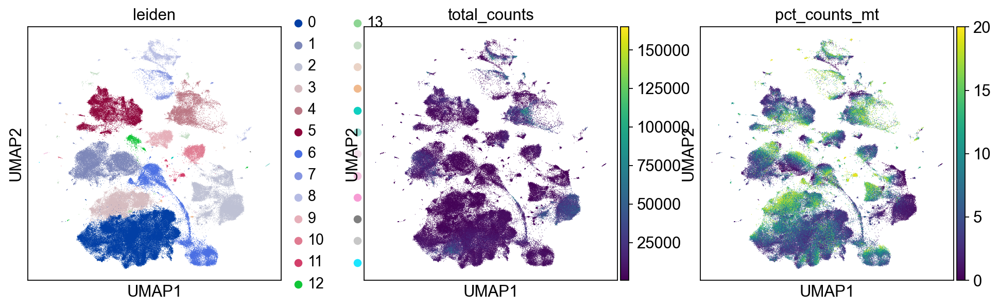

In [11]:
sc.pl.umap(combined[combined.obs.pct_counts_mt<=20], color=['leiden','total_counts', 'pct_counts_mt'])

(0.0, 6000.0)

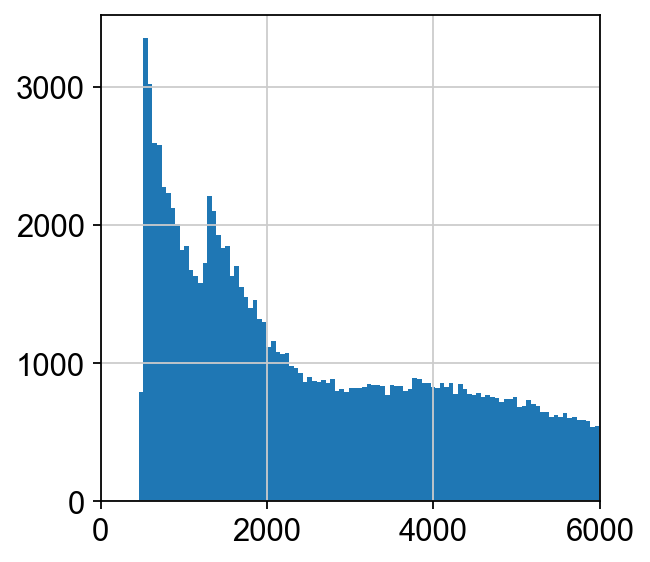

In [12]:
plt.hist(combined.obs['total_counts'], bins= 3000)
plt.xlim(0, 6000)

(0.0, 6000.0)

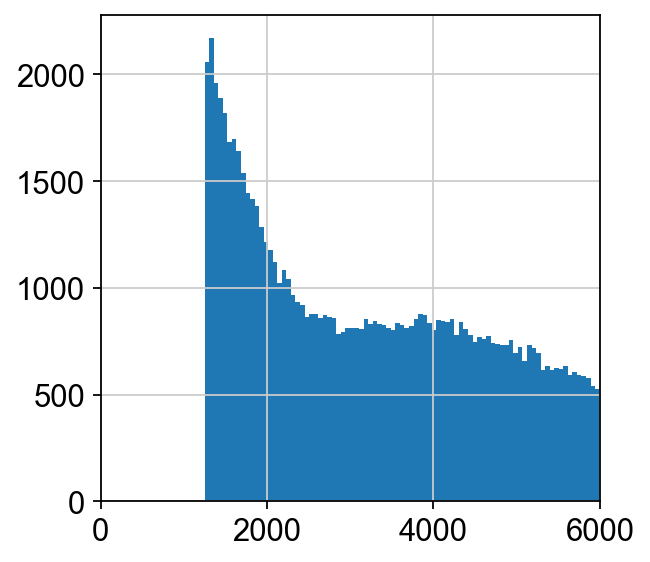

In [13]:
plt.hist(combined[combined.obs['total_counts']>=1250].obs['total_counts'], bins= 3000)
plt.xlim(0, 6000)

In [14]:
combined = combined[combined.obs.total_counts >=1250, :]

In [15]:
combined = combined[combined.obs.pct_counts_mt < 20, :]

In [16]:
combined

View of AnnData object with n_obs × n_vars = 117045 × 38224
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'umap', 'leiden_colors'
    obsm: 'X_scVI', 'X_umap', 'scvi'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

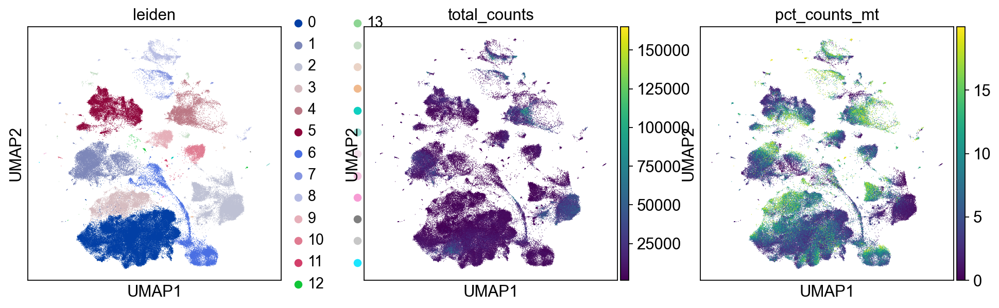

In [17]:
sc.pl.umap(combined, color=['leiden','total_counts', 'pct_counts_mt'])

In [19]:
sc.pp.neighbors(combined,n_neighbors = 30, use_rep="X_scVI", random_state=0)
sc.tl.umap(combined, random_state=0)

computing neighbors


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:21)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:50)


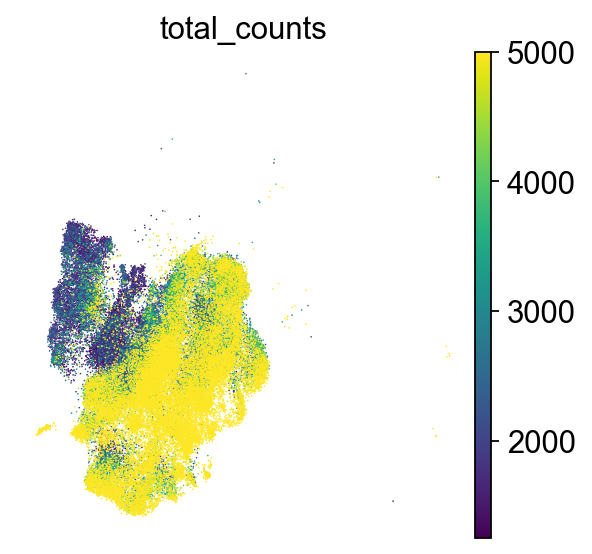

In [20]:
sc.pl.umap(combined[combined.obs['leiden'].isin(['0', '3'])], color=['total_counts'], 
           frameon=False, vmin=1250, vmax=5000)

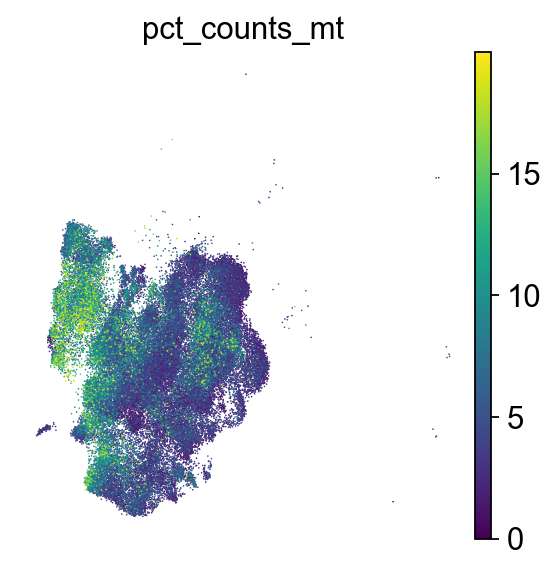

In [21]:
sc.pl.umap(combined[combined.obs['leiden'].isin(['0', '3'])], color=['pct_counts_mt'], 
           frameon=False)

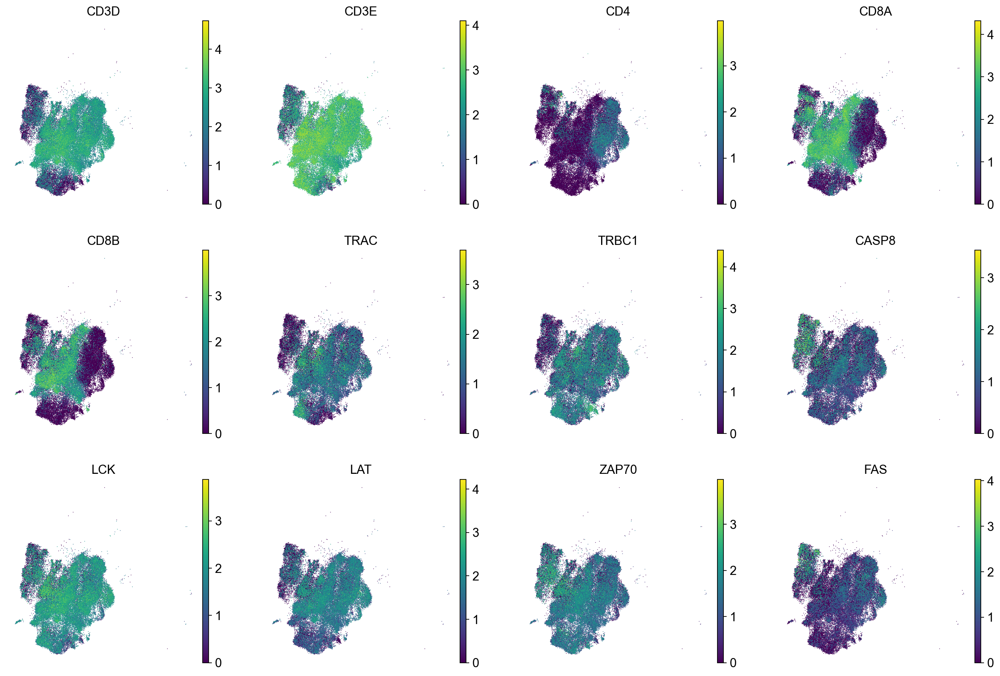

In [22]:
sc.pl.umap(combined[combined.obs['leiden'].isin(['0', '3'])], color=['CD3D','CD3E','CD4','CD8A','CD8B', 'TRAC', 'TRBC1', 'CASP8', "LCK", "LAT", "ZAP70",'FAS'], frameon=False)

In [ ]:
sc.pl.umap(combined, color=['total_counts'], 
           frameon=False, vmin=1250, vmax=5000)

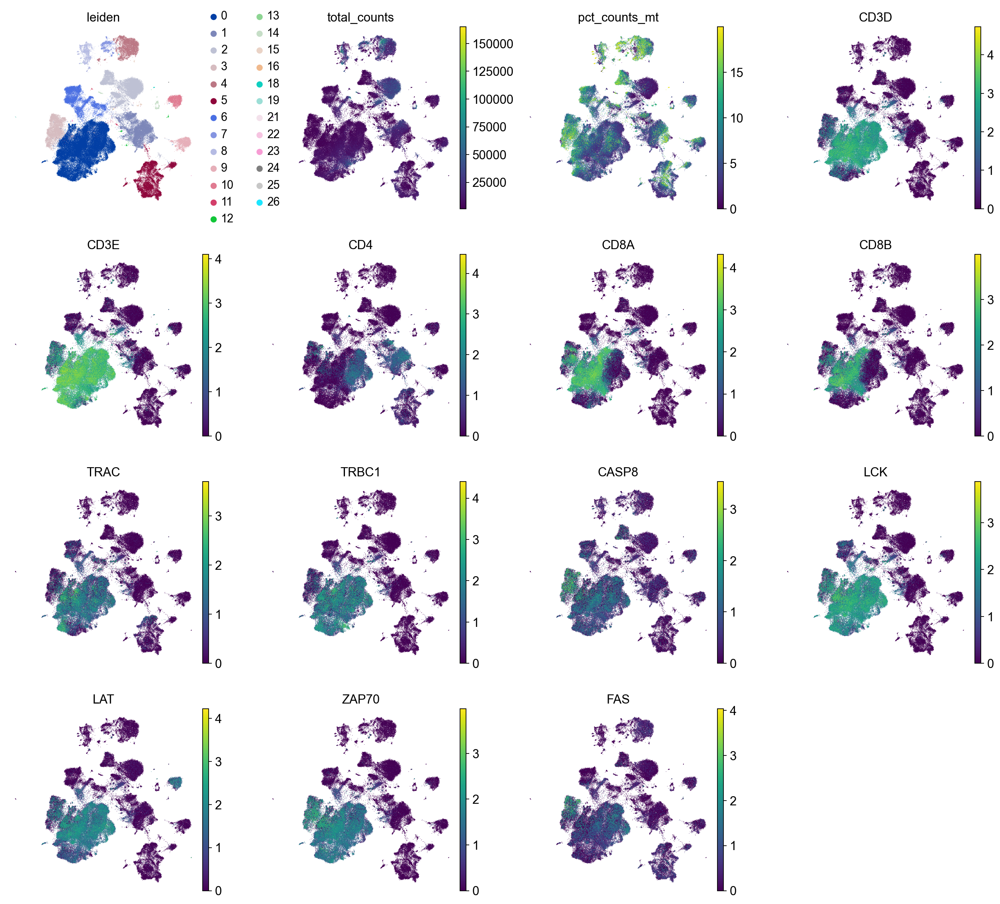

In [20]:
sc.pl.umap(combined, color=['leiden','total_counts', 'pct_counts_mt','CD3D','CD3E','CD4','CD8A','CD8B', 'TRAC', 'TRBC1', 'CASP8', "LCK", "LAT", "ZAP70",'FAS'], frameon=False)

In [19]:
sc.tl.leiden(combined,resolution=0.15,key_added='leiden_0.15', random_state=0)

running Leiden clustering


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_6275/2568044223.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(combined,resolution=0.15,key_added='leiden_0.15', random_state=0)


    finished: found 18 clusters and added
    'leiden_0.15', the cluster labels (adata.obs, categorical) (0:01:20)


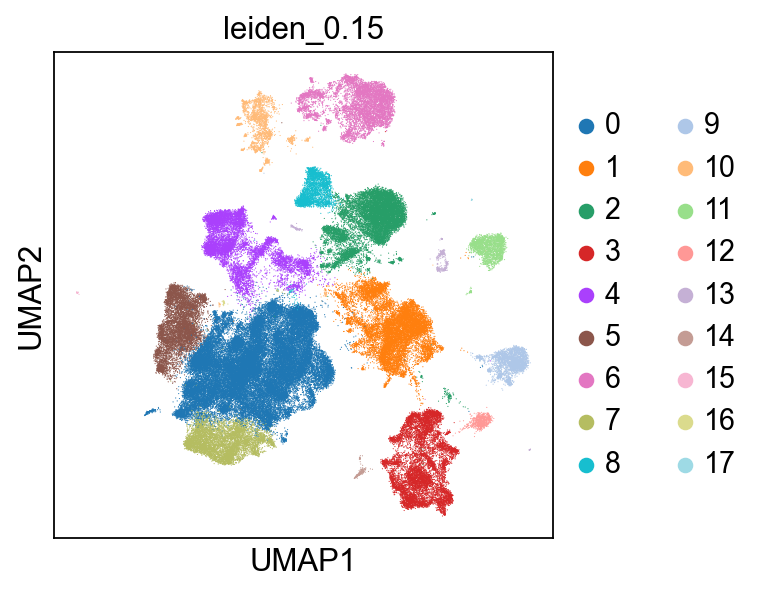

In [20]:
sc.pl.umap(combined, color=['leiden_0.15'])

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_6275/711434264.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=combined.obsm["X_umap"][:,0][randomize],y=combined.obsm["X_umap"][:,1][randomize], hue=combined.obs[meta][randomize],s=2).set(title=meta)
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_6275/711434264.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=combined.obsm["X_umap"][:,0][randomize],y=combined.obsm["X_umap"][:,1][randomize], hue=combined.obs[meta][randomize],s=2).set(title=meta)
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000

<Figure size 320x320 with 0 Axes>

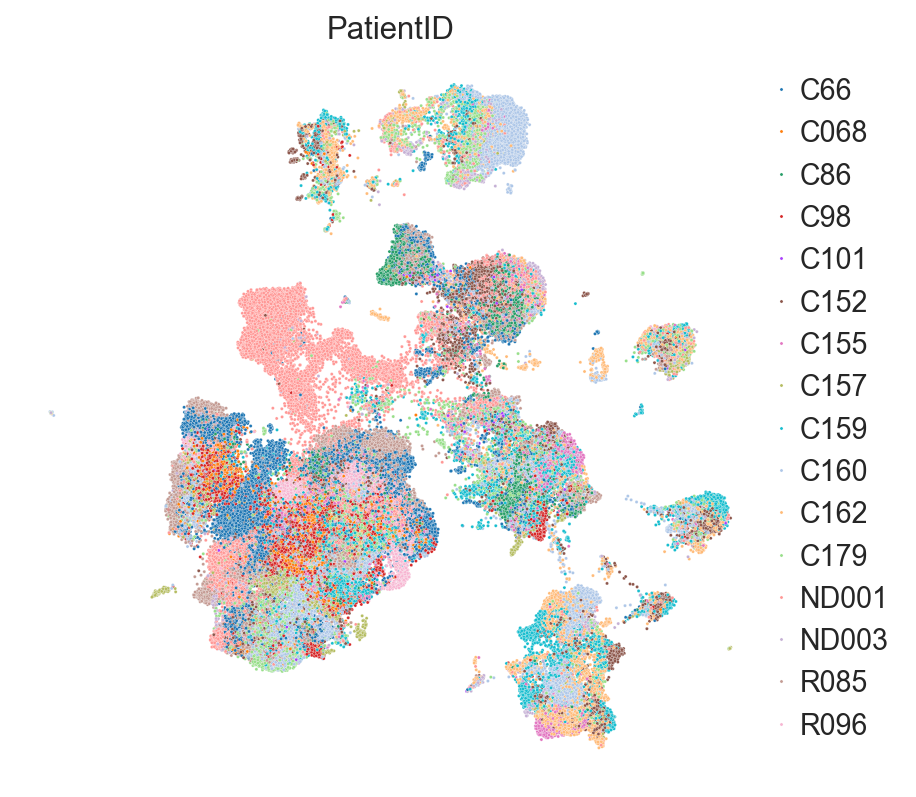

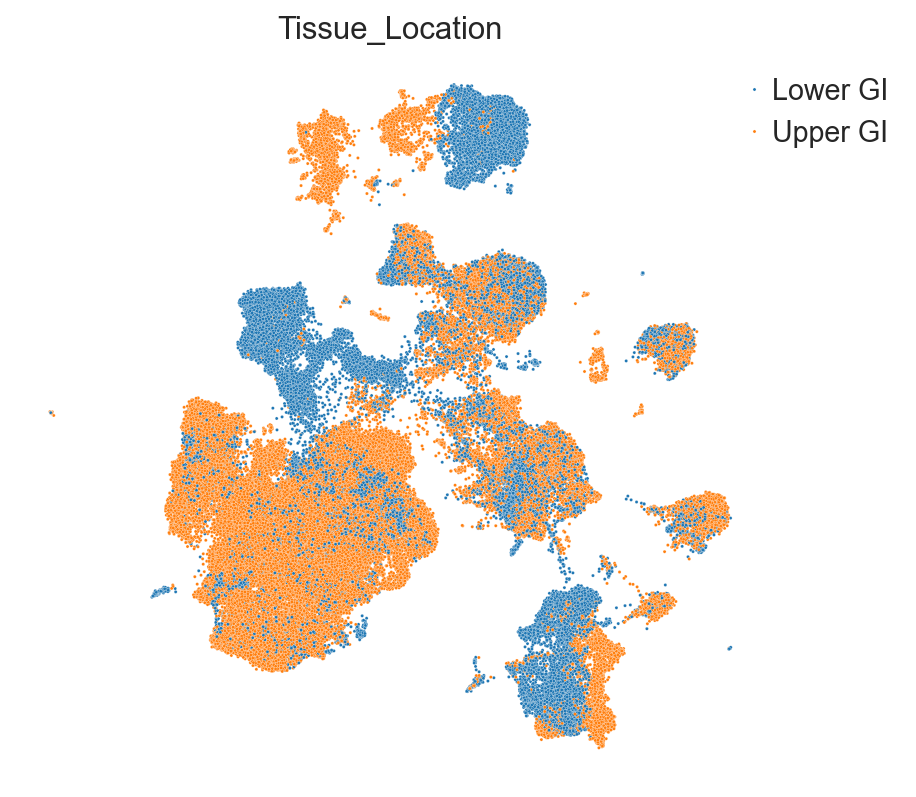

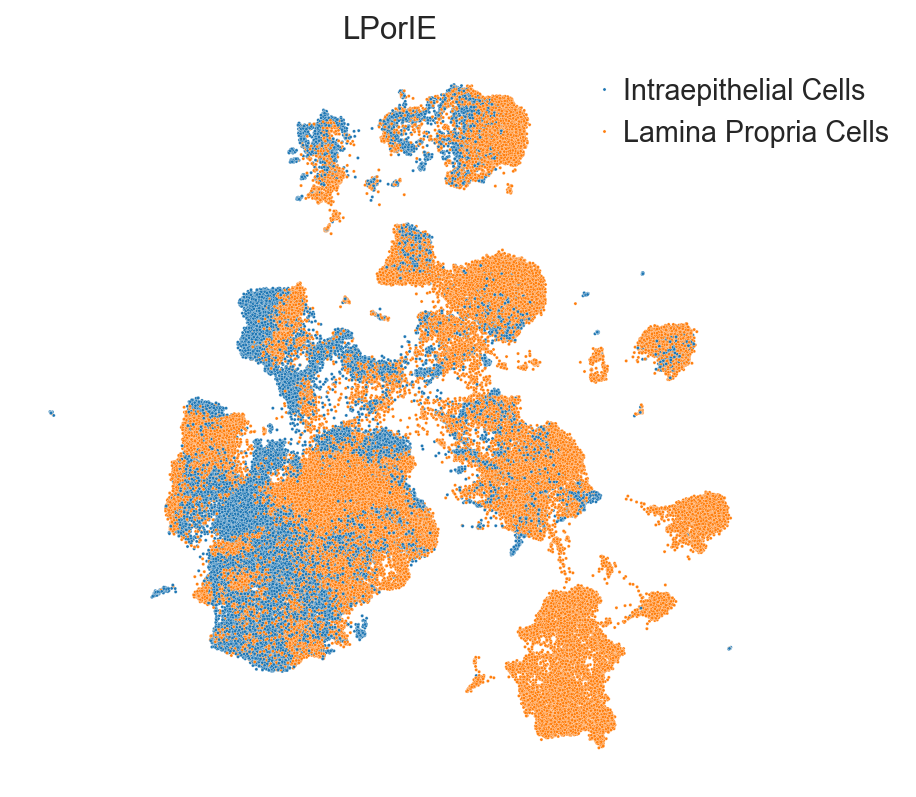

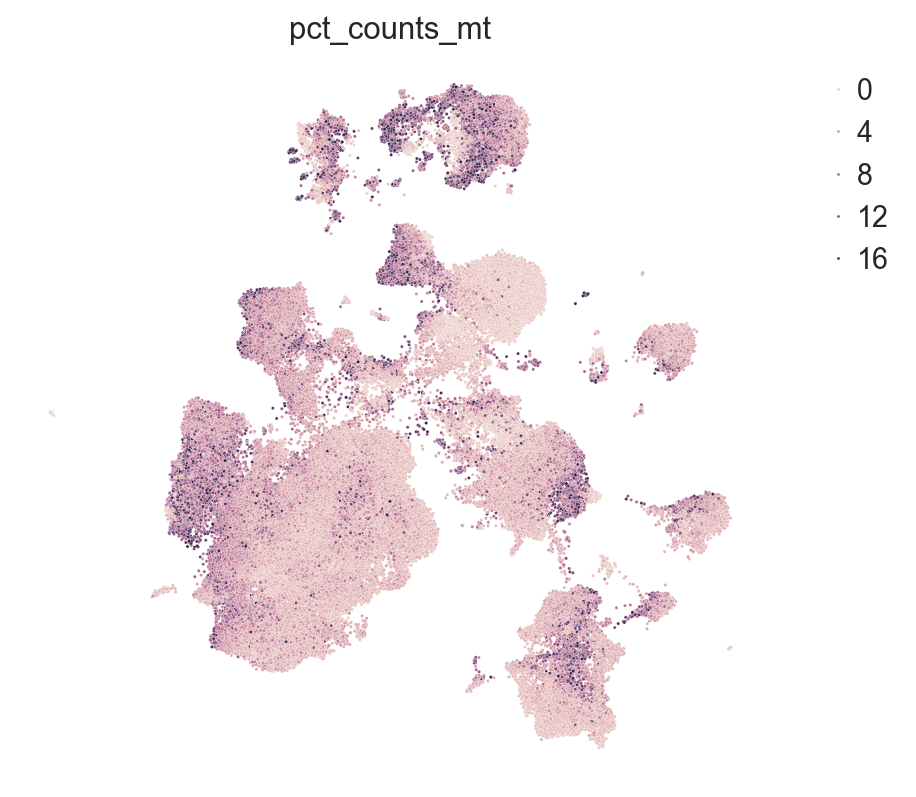

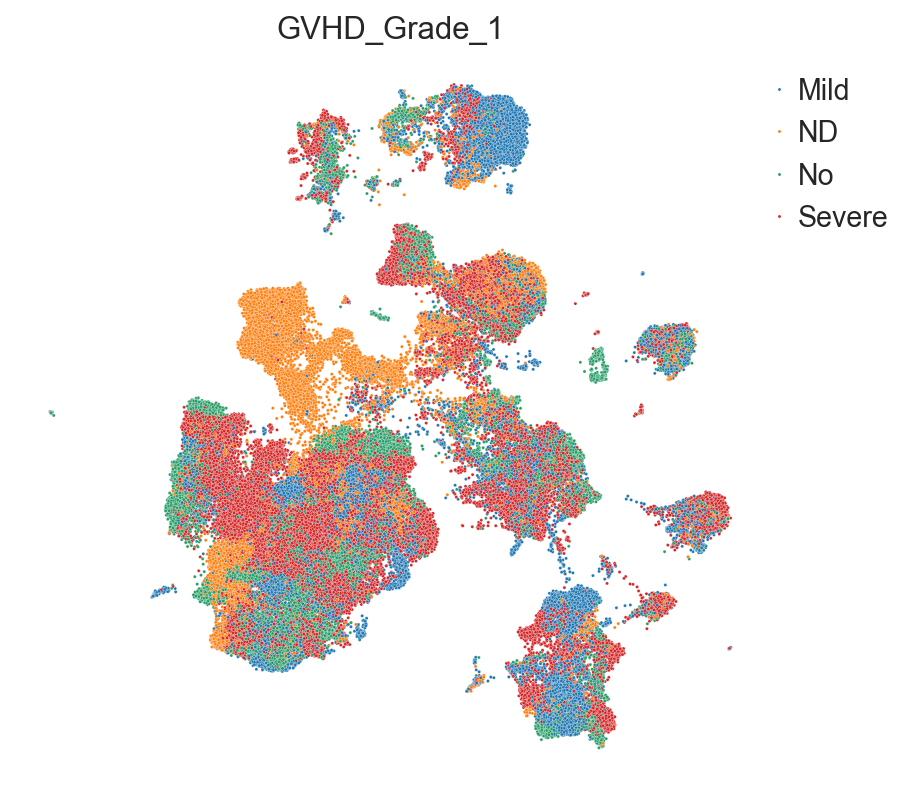

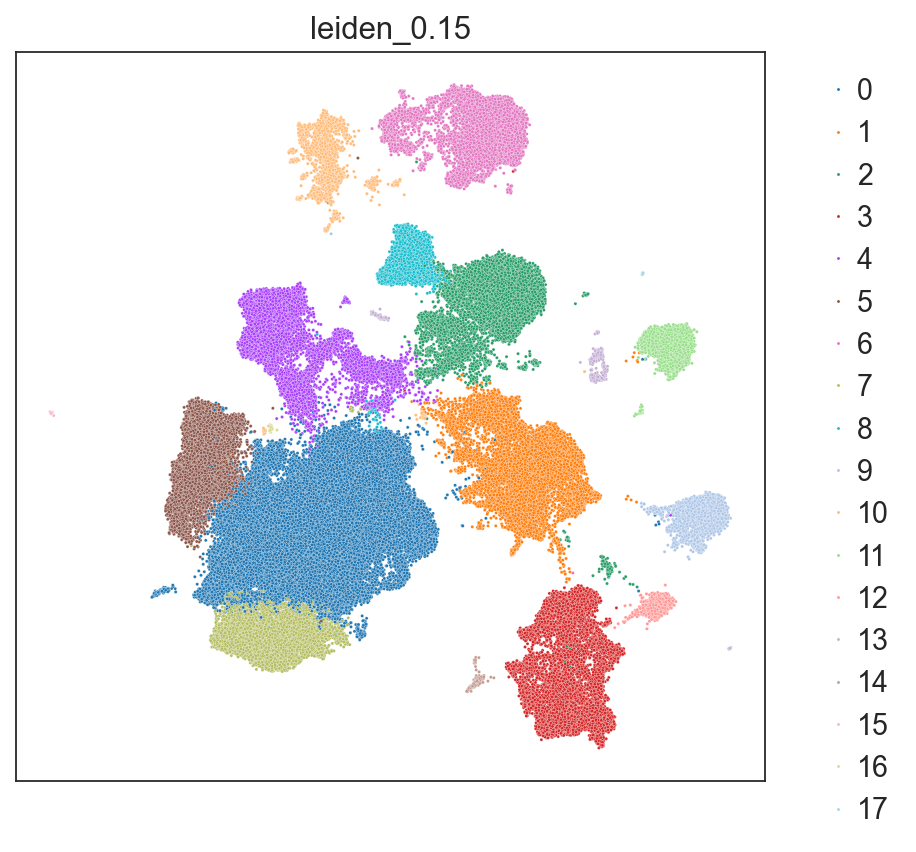

In [21]:
#palette
for meta in ['PatientID','Tissue_Location', 'LPorIE', 'pct_counts_mt', 'GVHD_Grade_1','leiden_0.15' ]:
    randomize=np.arange(len(combined.obs[meta]))
    np.random.shuffle(randomize)
    sns.set_style("white", {'axes.grid' : False})
    sns.despine(bottom=True, left=True)
    fig, ax = plt.subplots(figsize=(6,6), dpi=80)
    scatter=sns.scatterplot(x=combined.obsm["X_umap"][:,0][randomize],y=combined.obsm["X_umap"][:,1][randomize], hue=combined.obs[meta][randomize],s=2).set(title=meta)
    plt.xticks([])
    plt.yticks([])
    #plt.legend(bbox_to_anchor=(1.02, 1), , borderaxespad=0)
    plt.legend(frameon=False,loc='upper right', bbox_to_anchor=(1.2, 1))
    # plt.savefig(PROJECT_ROOT / 'Figures/Single_cell_figures' / f'{meta}_umap.pdf', transparent=True)
    # plt.savefig(PROJECT_ROOT / 'Figures/Single_cell_figures' / f'{meta}_umap.png', transparent=True)
    # plt.savefig(PROJECT_ROOT / 'Figures/Single_cell_figures' / f'{meta}_umap.svg', transparent=True)

In [22]:
sc.tl.rank_genes_groups(combined, groupby="leiden_0.15",use_raw=False, method='wilcoxon')
dedf = sc.get.rank_genes_groups_df(combined, group=None)
dedf.to_csv(DEDF_OUTPUT_PATH)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:03:32)


In [23]:
#Get rid of mitochondrial genes and ribosomal genes
filtered_combined_list = [name for name in combined.var_names if not name.startswith("MT") and not name.startswith("RPS") and not name.startswith("RPL")]

In [24]:
filtered_combined = combined[:, filtered_combined_list]

In [25]:
len(filtered_combined_list)

38012

In [26]:
combined

AnnData object with n_obs × n_vars = 117045 × 38224
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'umap', 'leiden_colors', 'leiden_0.15', 'leiden_0.15_colors', 'rank_genes_groups'
    obsm: 'X_scVI', 'X_umap', 'scvi'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [27]:
filtered_combined

View of AnnData object with n_obs × n_vars = 117045 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'umap', 'leiden_colors', 'leiden_0.15', 'leiden_0.15_colors', 'rank_genes_groups'
    obsm: 'X_scVI', 'X_umap', 'scvi'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [28]:
#Double check those gene are gone
filtered_combined.var['mt'] = filtered_combined.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(filtered_combined, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_6275/2776793339.py:2: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  filtered_combined.var['mt'] = filtered_combined.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'


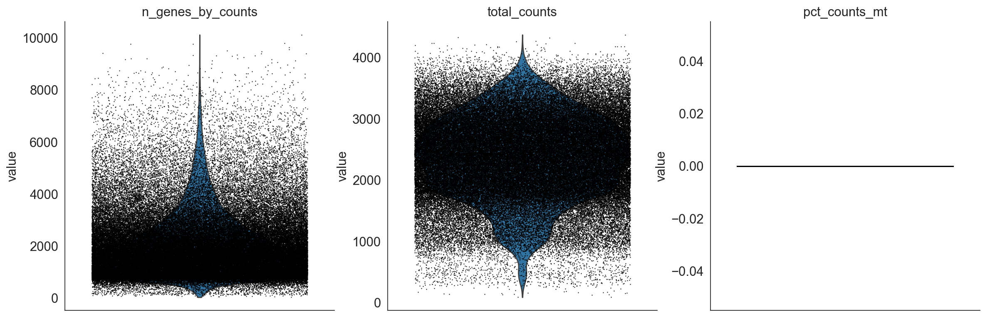

In [29]:
sc.pl.violin(filtered_combined, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [30]:
filtered_combined.write(FILTERED_PATH)